In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
cr_wrd_img=cv2.imread('DATA/crossword.jpg',0)

## Thresholding

In [7]:
def show_img(img):
    fig=plt.figure(figsize=(15,15))
    ax=fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

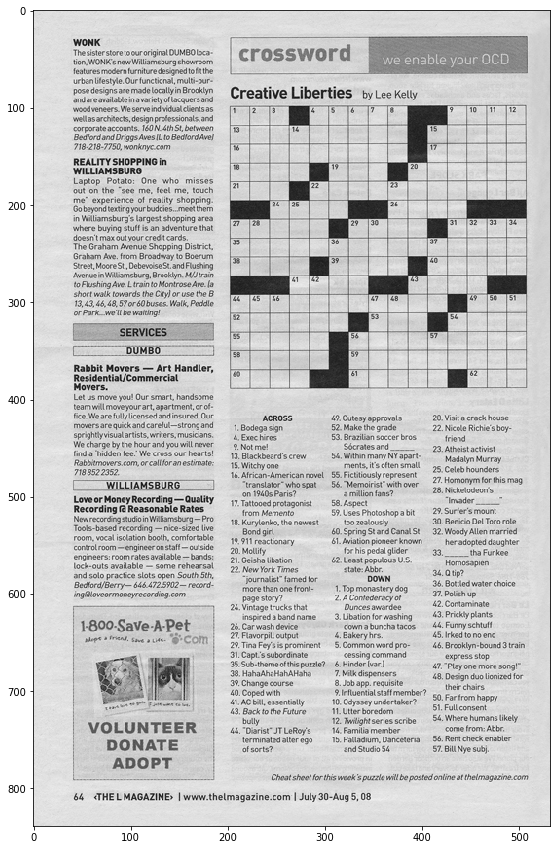

In [8]:
show_img(cr_wrd_img)

In [9]:
ret,thres1=cv2.threshold(cr_wrd_img,127,255,cv2.THRESH_BINARY)

In [10]:
ret

127.0

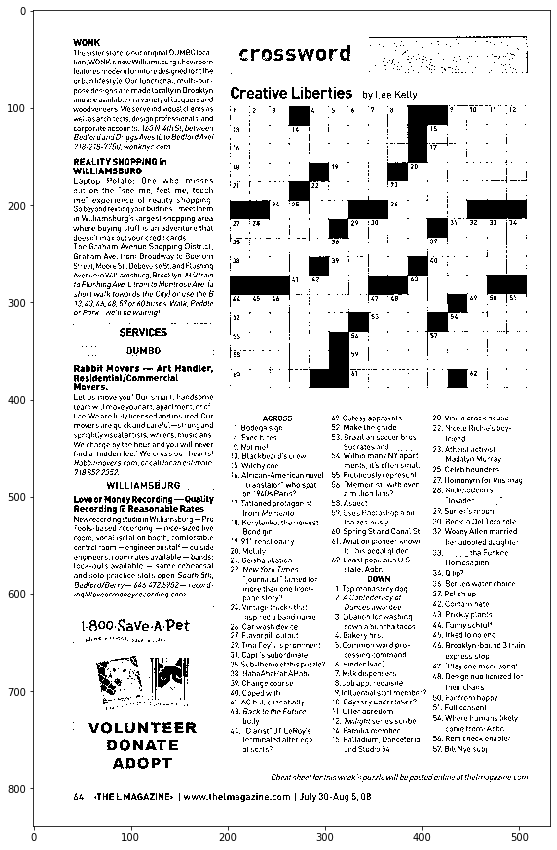

In [11]:
show_img(thres1)

In [12]:
ret,thres2=cv2.threshold(cr_wrd_img,127,255,cv2.THRESH_TRUNC)

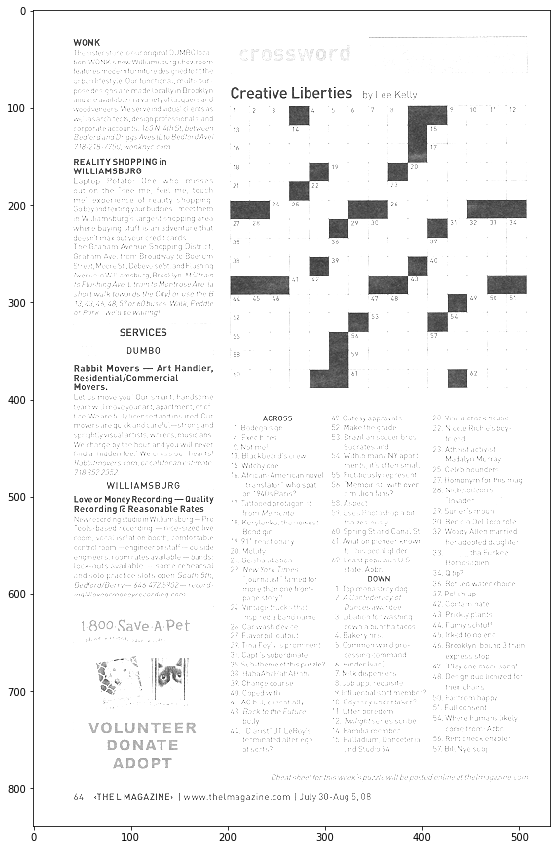

In [14]:
show_img(thres2)

In [20]:
thres3=cv2.adaptiveThreshold(cr_wrd_img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,8)

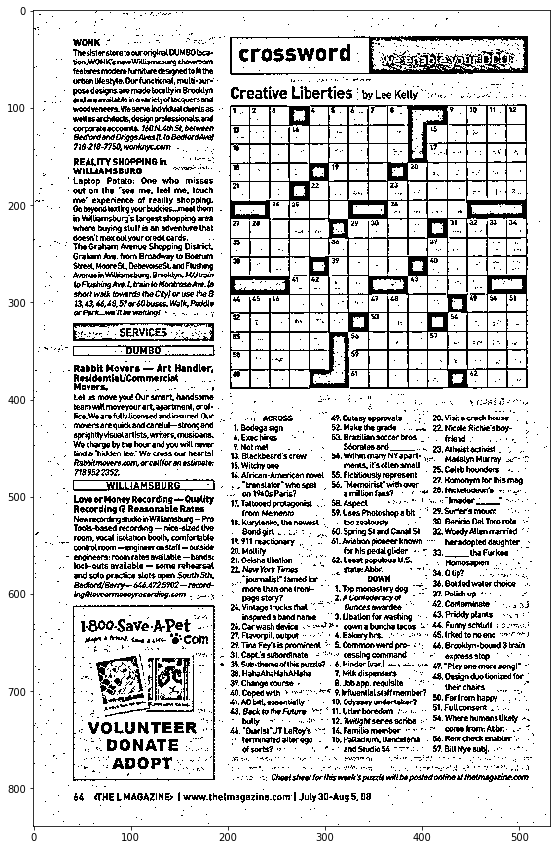

In [21]:
show_img(thres3)

In [27]:
final_blend=cv2.addWeighted(src1=thres3,alpha=0.6,src2=thres2,beta=0.4,gamma=0)

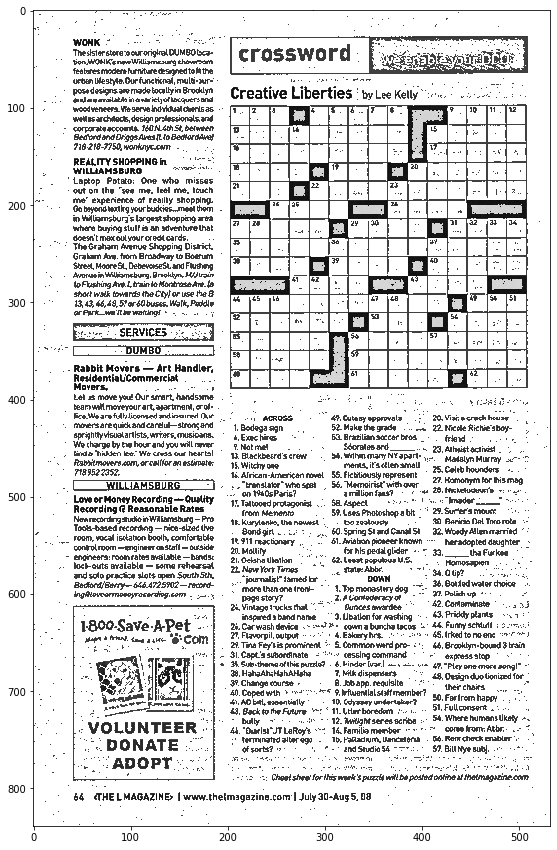

In [28]:
show_img(final_blend)

## blurring smoothing
- Blurring is used to remove the noise

In [4]:
def load_img():
    # convert image from 0 255 range to 0 to 1
    bricks_img=cv2.imread('DATA/bricks.jpg').astype(np.float32)/255
    bricks_img=cv2.cvtColor(bricks_img,cv2.COLOR_BGR2RGB)
    return bricks_img
    

In [5]:
def display_img(img):
    fig=plt.figure(figsize=(10,8))
    ax=fig.add_subplot(111)
    ax.imshow(img)


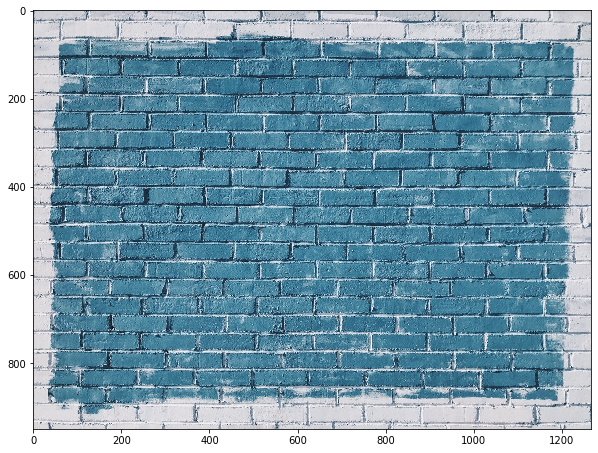

In [6]:
img=load_img()
display_img(img)

## influence of gamma on image

In [7]:
gamma=2

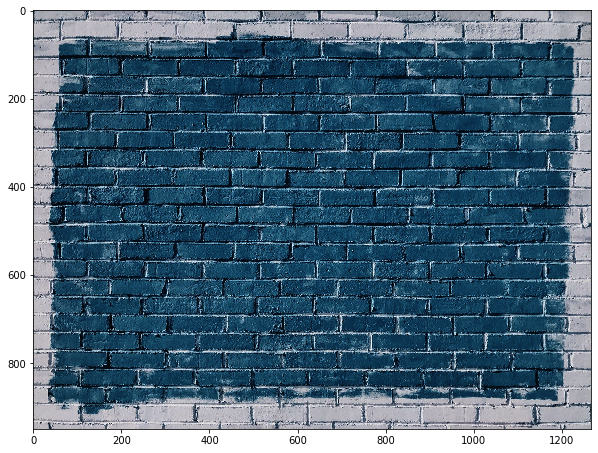

In [8]:
result=np.power(img,gamma)
display_img(result)

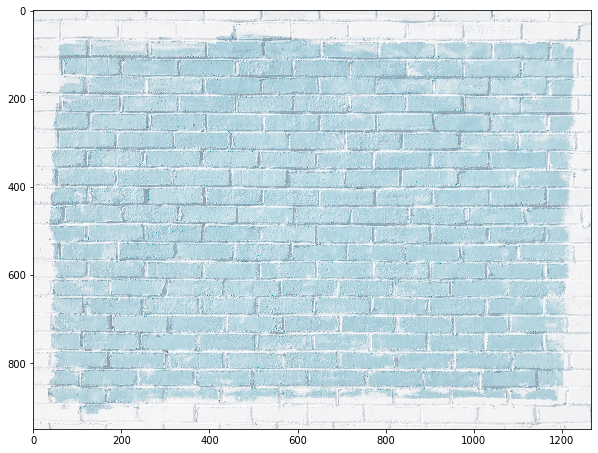

In [9]:
result=np.power(img,1/4)
display_img(result)

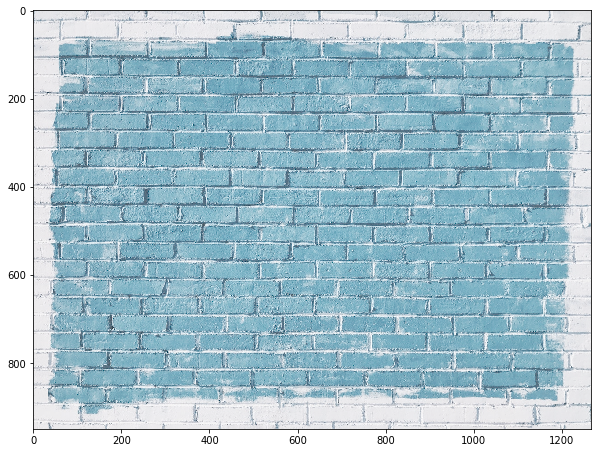

In [10]:
result=np.power(img,1/2)
display_img(result)

In [11]:
def load_img_text():
    org_img=load_img()
    font=cv2.FONT_HERSHEY_COMPLEX
    img=cv2.putText(org_img,'bricks',fontFace=font,fontScale=12,org=(10,600),color=(255,0,0),thickness=5)
    return img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


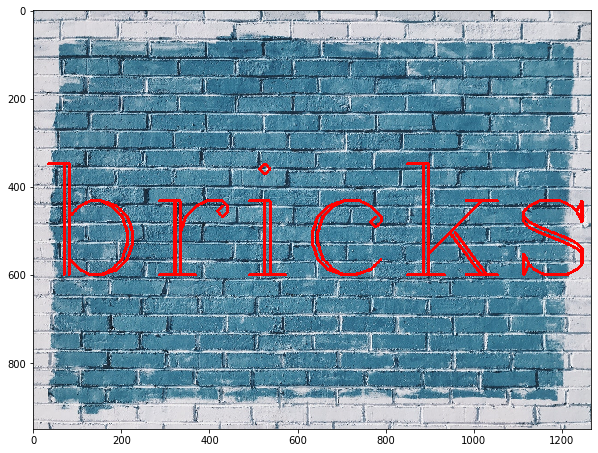

In [12]:
display_img(load_img_text())

In [13]:
img1=load_img_text()

In [18]:
## using custom kernel
kerl=np.ones((5,5)).astype(np.float32)/25

In [19]:
kerl

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [20]:
#ddepth desired depth if -1 it get depth of original image
dst=cv2.filter2D(img1,-1,kernel=kerl)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


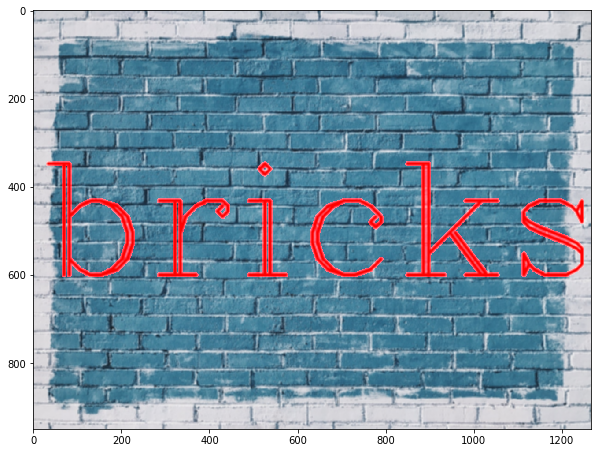

In [21]:
display_img(dst)

In [ ]:
# using predefined kernel

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


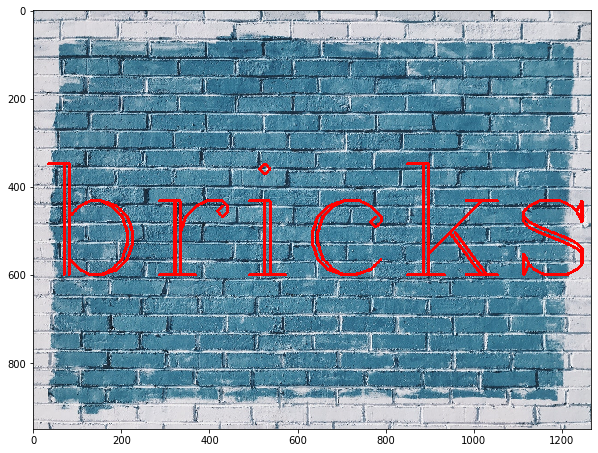

In [23]:
img2=load_img_text()
display_img(img2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


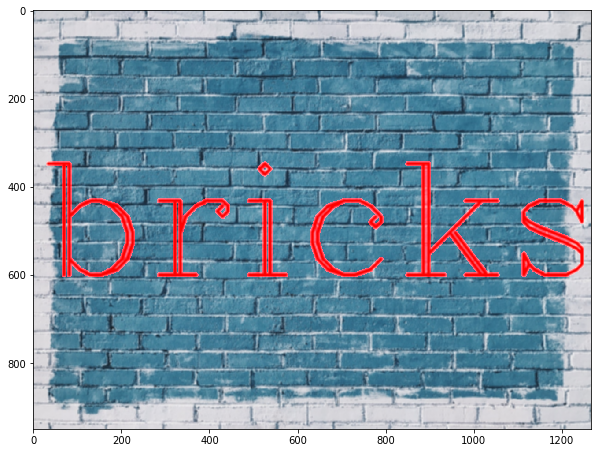

In [28]:
display_img(cv2.blur(img2,ksize=(5,5))) #ksize = shape of kernel to be used

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


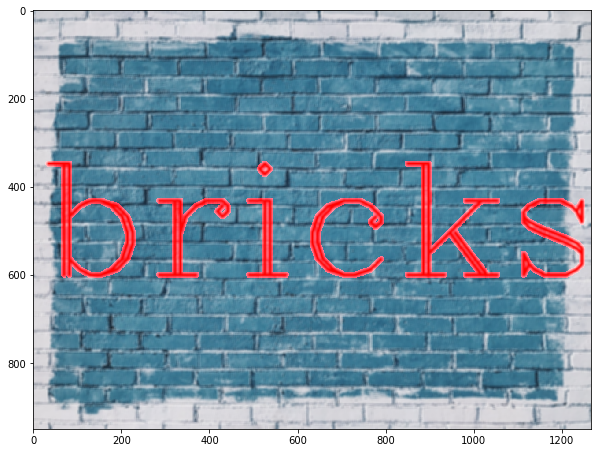

In [36]:
display_img(cv2.GaussianBlur(img2,ksize=(7,7),sigmaX=10)) #gap in letter still has hue noise

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


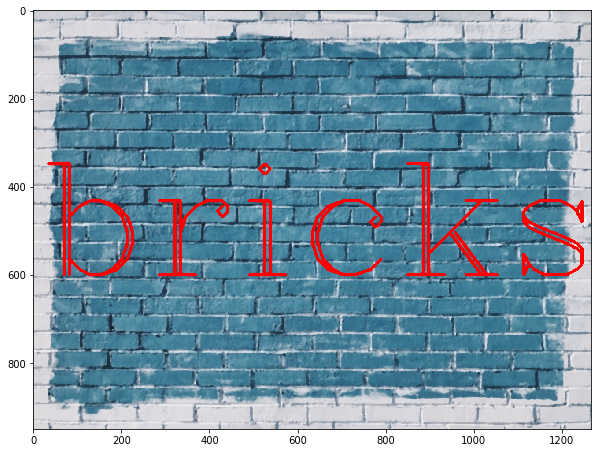

In [37]:
display_img(cv2.medianBlur(img2,ksize=5)) # gap in letter is not present

In [38]:
# testing median Blur on noise image

In [58]:
sammy_img=cv2.imread('DATA/sammy.jpg').astype(np.float32)/255
sammy_img=cv2.cvtColor(sammy_img,cv2.COLOR_BGR2RGB)

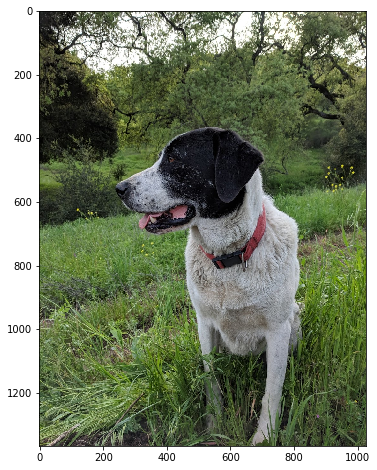

In [59]:
display_img(sammy_img)

In [55]:
sammy_noisy=cv2.imread('DATA/sammy_noise.jpg').astype(np.float32)/255
#sammy_noisy=cv2.cvtColor(sammy_noisy,cv2.COLOR_BGR2RGB)

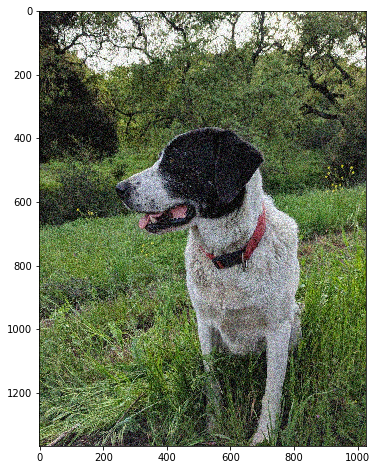

In [56]:
display_img(sammy_noisy)

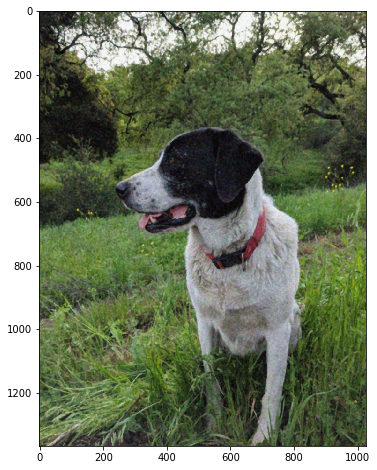

In [57]:
display_img(cv2.medianBlur(sammy_noisy,ksize=5))

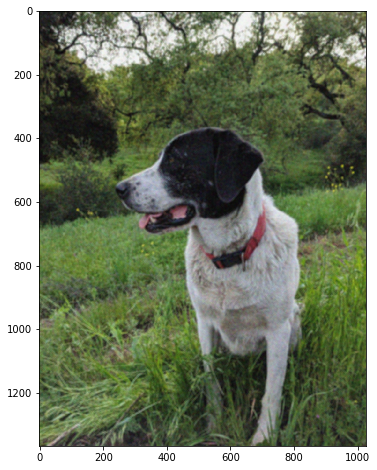

In [60]:
display_img(cv2.bilateralFilter(sammy_noisy,9,75,75))# good filter but slower than other filters

## Morphology

In [7]:
def load_text():
    org_img=np.zeros((600,600))
    font=cv2.FONT_HERSHEY_SIMPLEX
    img=cv2.putText(org_img,'DIVAKAR',fontFace=font,fontScale=4,org=(50,300),color=(255,255,255),thickness=20)
    return img

In [194]:
def display(img,cmap='gray'):
    fig=plt.figure(figsize=(12,10))
    ax=fig.add_subplot(111)
    ax.imshow(img,cmap)


In [9]:
img=load_text()

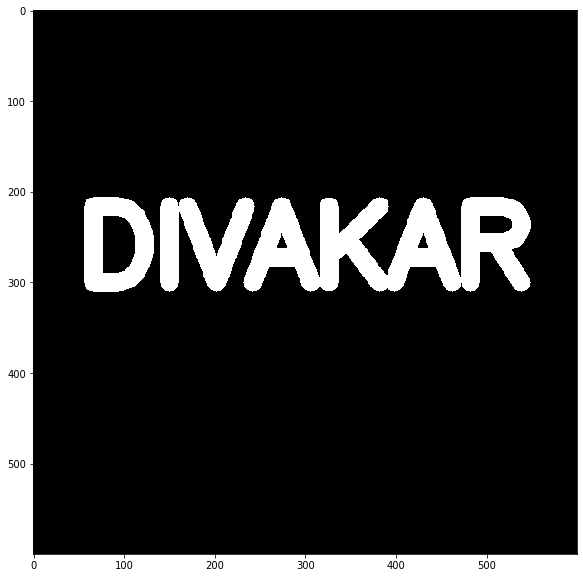

In [10]:
display(img)

In [11]:
#creating kernel
kernel=np.ones((6,6),dtype=np.int)

In [12]:
kernel=kernel/5

In [13]:
kernel

array([[0.2, 0.2, 0.2, 0.2, 0.2, 0.2],
       [0.2, 0.2, 0.2, 0.2, 0.2, 0.2],
       [0.2, 0.2, 0.2, 0.2, 0.2, 0.2],
       [0.2, 0.2, 0.2, 0.2, 0.2, 0.2],
       [0.2, 0.2, 0.2, 0.2, 0.2, 0.2],
       [0.2, 0.2, 0.2, 0.2, 0.2, 0.2]])

In [14]:
eroded_img=cv2.erode(img,kernel=kernel,iterations=1)

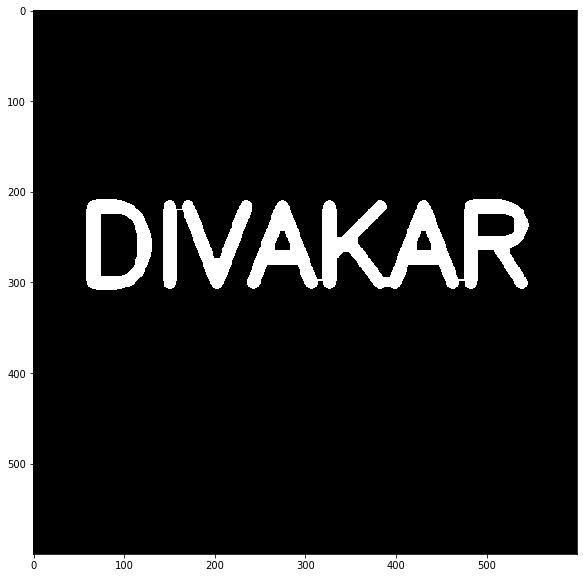

In [15]:
display(eroded_img)

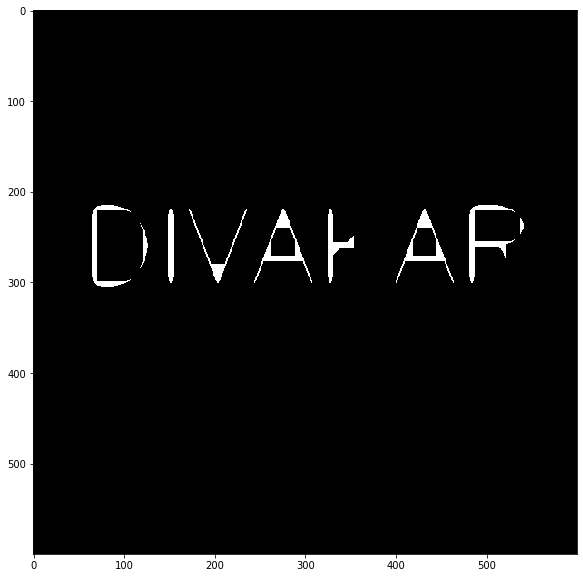

In [16]:
eroded_img1=cv2.erode(img,kernel=kernel,iterations=3) ## as iteration increases more the erosion is ...
display(eroded_img1)

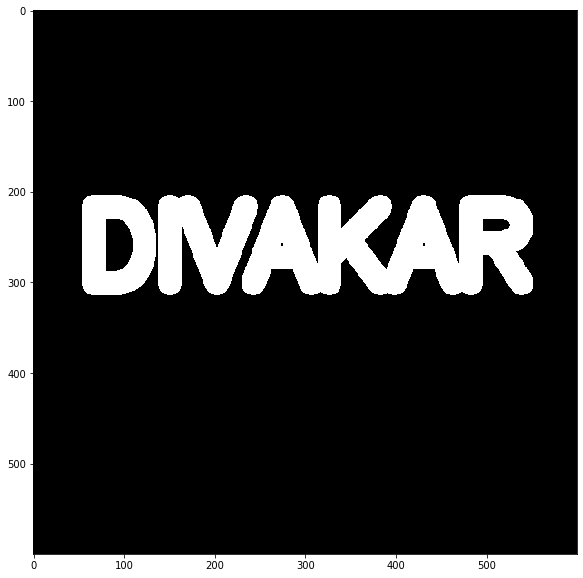

In [17]:
display(cv2.dilate(img,kernel,iterations=1))

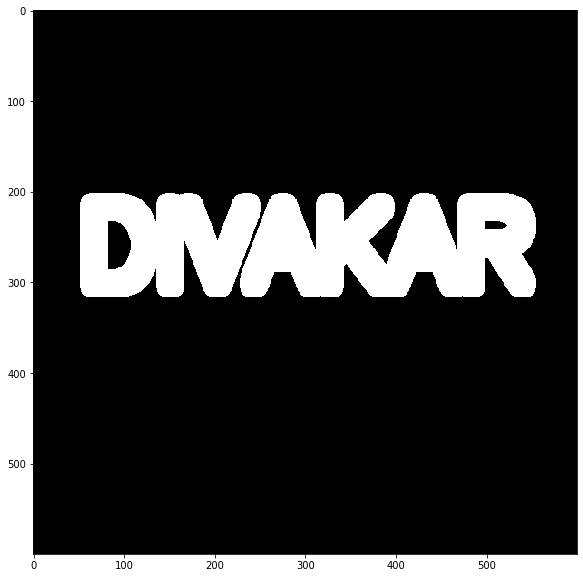

In [18]:
display(cv2.dilate(img,kernel,iterations=2))

In [19]:
## adding noise in background 
white_noise=np.random.randint(size=(600,600),low=0,high=2) # as high is exclusive not inclusive

In [20]:
white_noise

array([[1, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 1, 0],
       [1, 0, 0, ..., 1, 1, 0],
       ...,
       [1, 1, 0, ..., 0, 0, 1],
       [0, 1, 0, ..., 1, 1, 0],
       [1, 1, 0, ..., 0, 0, 0]])

In [21]:
#scaling from 0 - 1 to 0 - 255

In [22]:
white_noise=white_noise*255

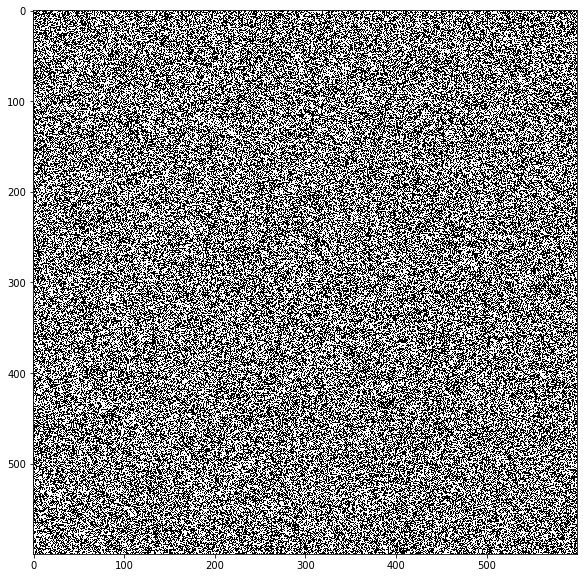

In [23]:
display(white_noise)

In [24]:
noisy_img=img+white_noise

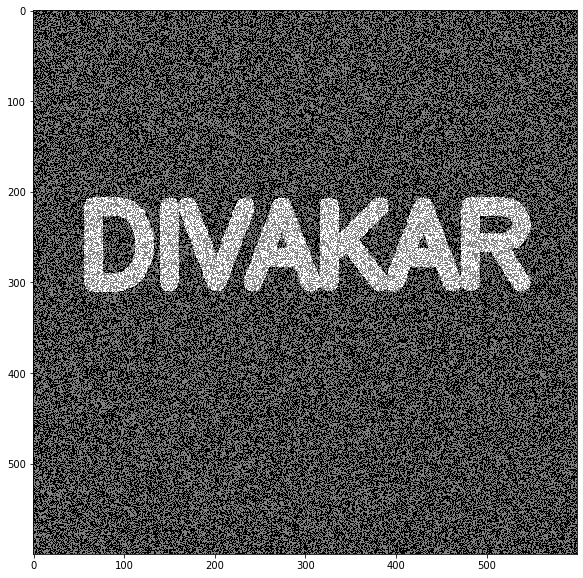

In [25]:
display(noisy_img)

In [26]:
## to clear background noise we have opening in morph

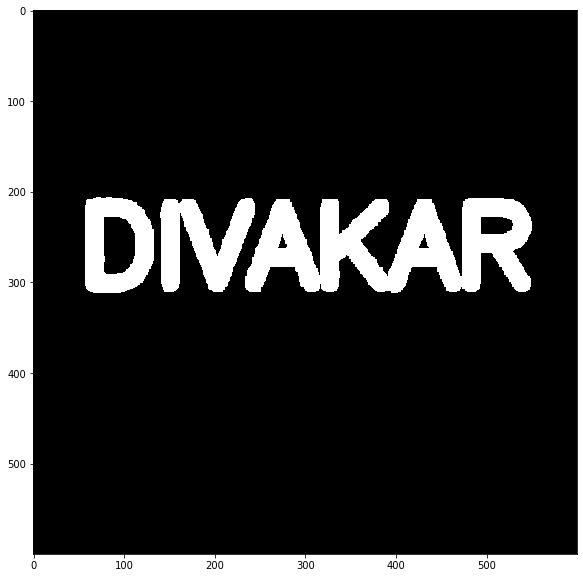

In [27]:
display(cv2.morphologyEx(noisy_img,cv2.MORPH_OPEN,kernel=kernel,iterations=1))

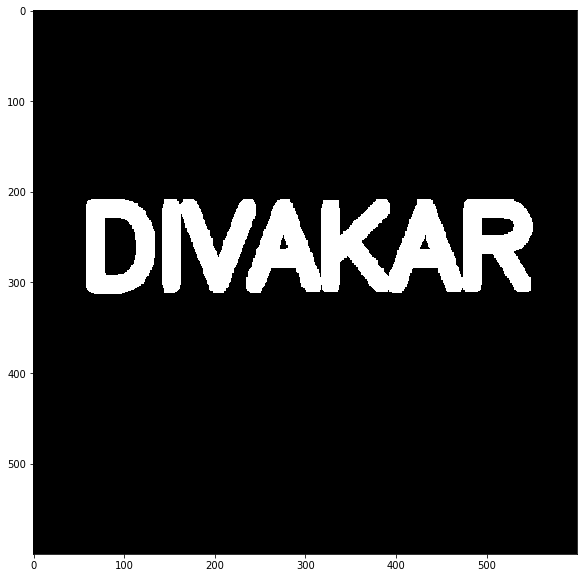

In [28]:
display(cv2.morphologyEx(noisy_img,cv2.MORPH_OPEN,kernel=kernel,iterations=2)) ## if iteration=2 then opeing process erode->erode->dilate->dilate  erode(to cut the edges) dilate(to bring back the image)

In [29]:
## to remove foreground noise ## morph closing

In [30]:
black_noise=np.random.randint(low=0,high=2,size=(600,600),dtype=np.int32)

In [31]:
#scaling black_noise
black_noise=black_noise*-255

In [32]:
black_noisy=img+black_noise

In [33]:
black_noisy

array([[   0.,    0., -255., ..., -255.,    0.,    0.],
       [-255.,    0.,    0., ...,    0.,    0., -255.],
       [   0.,    0., -255., ...,    0., -255.,    0.],
       ...,
       [   0., -255.,    0., ..., -255.,    0.,    0.],
       [   0.,    0., -255., ...,    0., -255.,    0.],
       [-255.,    0.,    0., ..., -255.,    0.,    0.]])

In [34]:
#-255 doesn't make any sense as value ranges from 0 to 255 so replacing them with 0
black_noisy[black_noisy==-255]=0

In [35]:
black_noisy

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

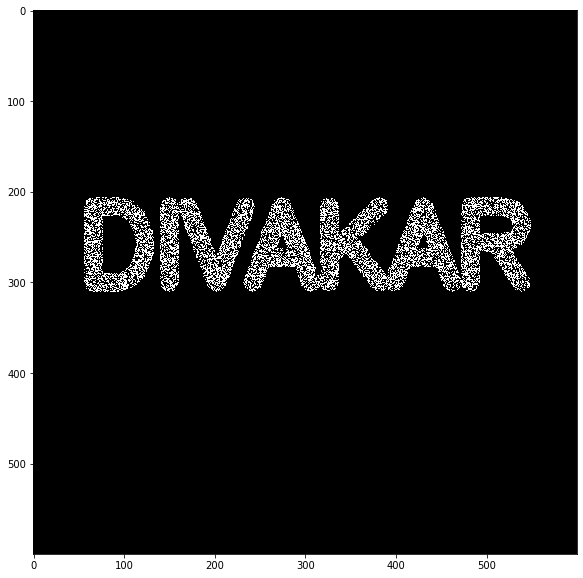

In [36]:
display(black_noisy)

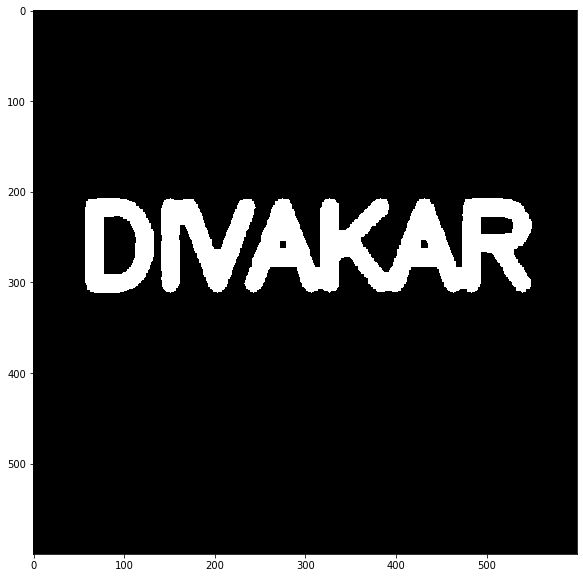

In [43]:
display(cv2.morphologyEx(black_noisy,op=cv2.MORPH_CLOSE,kernel=kernel,iterations=1))

In [44]:
## gradient gives output of difference between erode and dilate

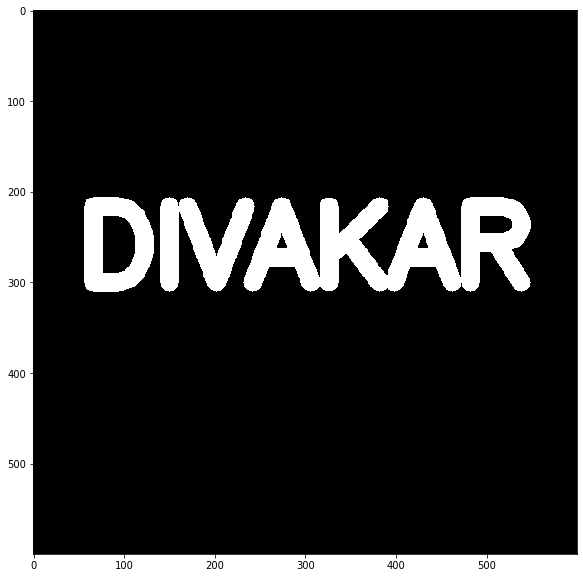

In [45]:
display(img)

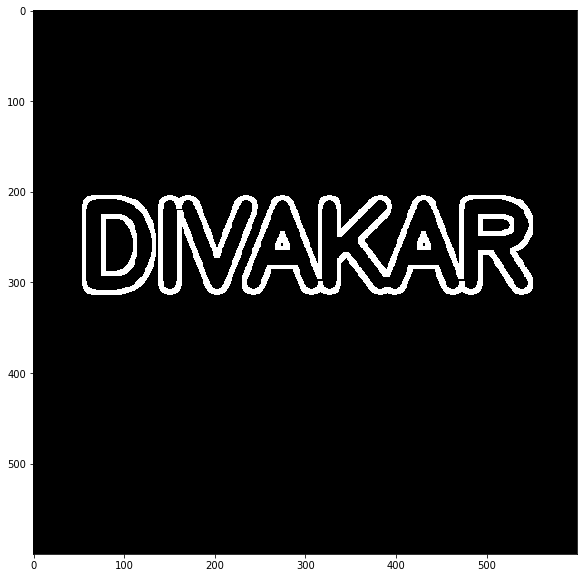

In [52]:
display(cv2.morphologyEx(img,op=cv2.MORPH_GRADIENT,kernel=kernel,iterations=1))

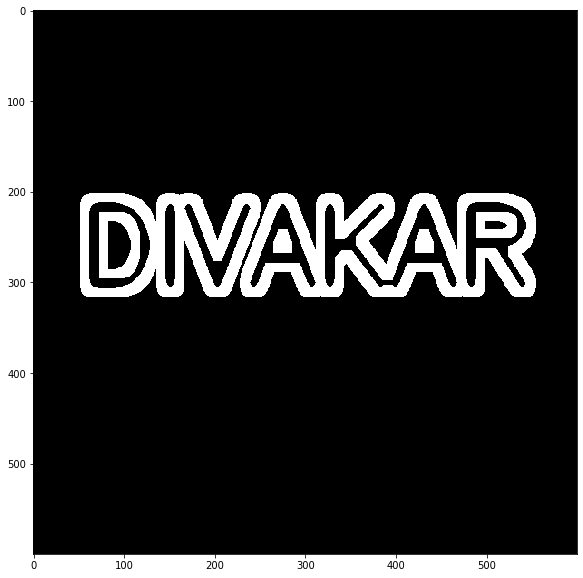

In [53]:
display(cv2.morphologyEx(img,op=cv2.MORPH_GRADIENT,kernel=kernel,iterations=2))

## gradient

In [63]:
sod=cv2.imread('DATA/sudoku.jpg',0)

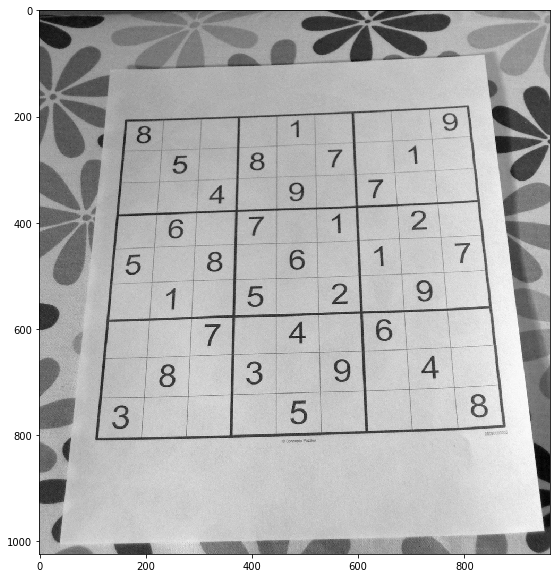

In [64]:
display(sod)

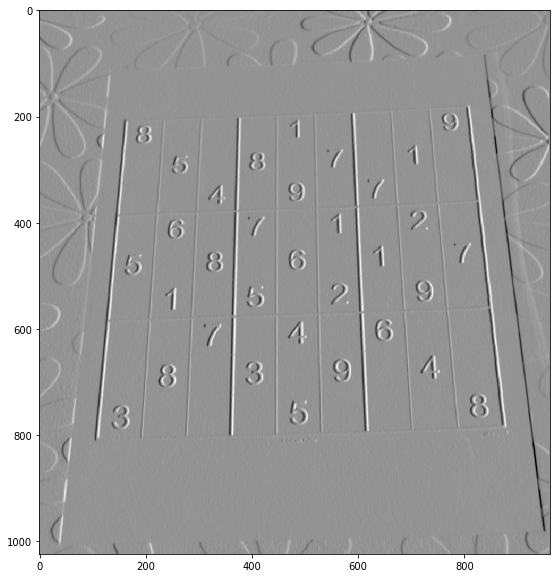

In [74]:
# X gradient
sobx=cv2.Sobel(sod,cv2.CV_64F,1,0,ksize=7)
display(sobx)

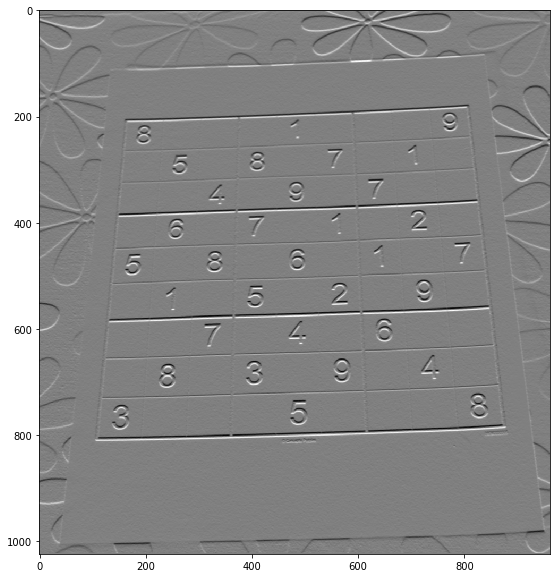

In [84]:
# Y gradient
soby=cv2.Sobel(sod,cv2.CV_64F,0,1,ksize=5)
display(soby)

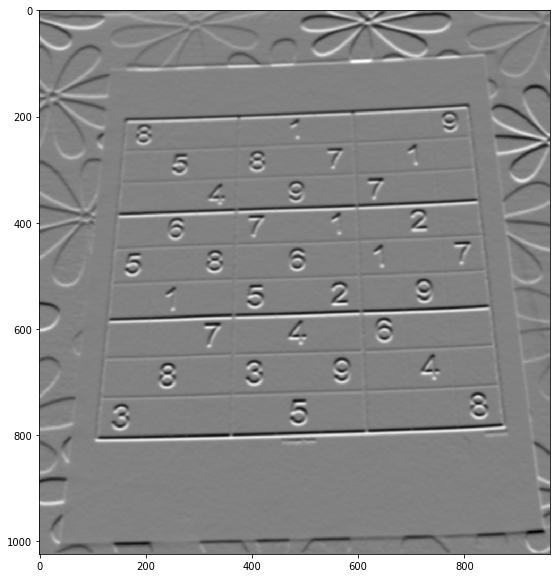

In [83]:
# Y gradient
soby25=cv2.Sobel(sod,cv2.CV_64F,0,1,ksize=25)
display(soby)

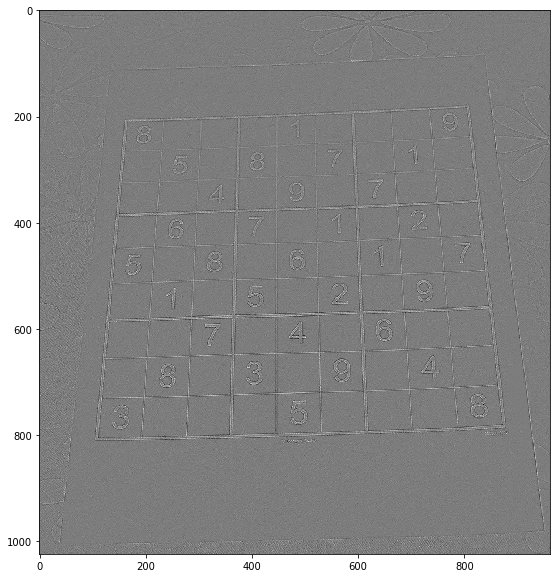

In [69]:
#laplacian
display(cv2.Laplacian(sod,cv2.CV_64F))

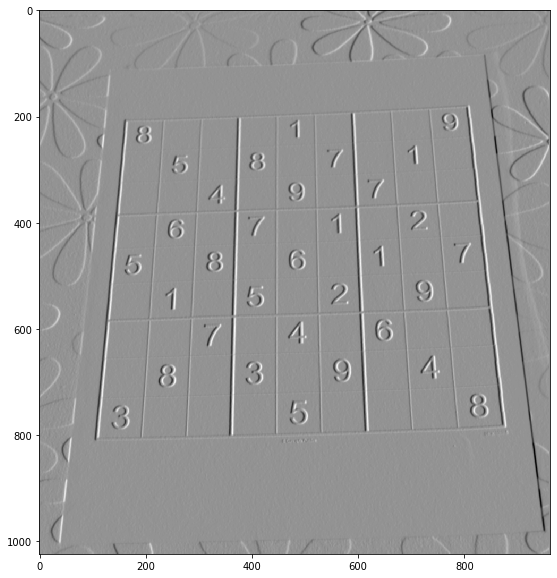

In [85]:
display(cv2.addWeighted(src1=sobx,alpha=0.5,src2=soby,beta=0.5,gamma=1))

In [86]:
ret,thres=cv2.threshold(sod,100,255,cv2.THRESH_BINARY)

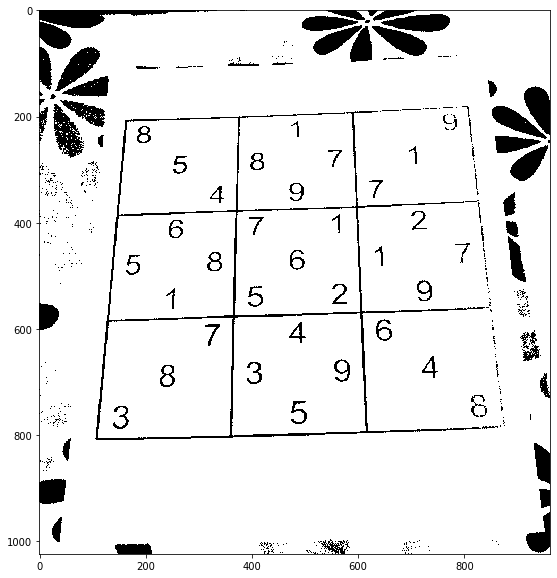

In [87]:
display(thres)

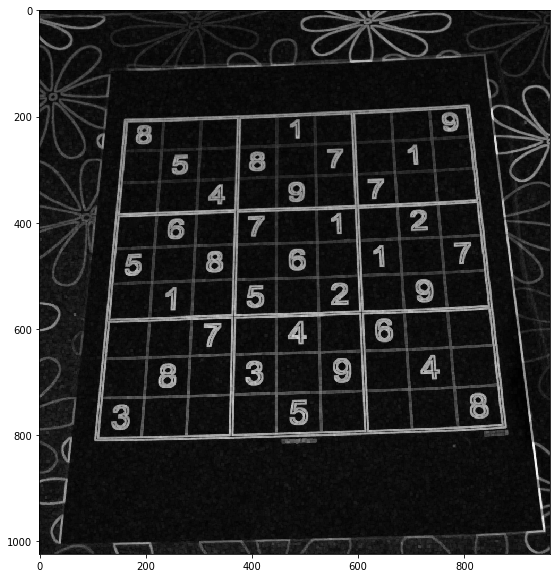

In [90]:
display(cv2.morphologyEx(sod,cv2.MORPH_GRADIENT,kernel=np.ones((5,5),dtype=np.int32),iterations=1))

In [91]:
## histograms in open cv

In [117]:
dark_horse = cv2.imread('DATA/horse.jpg')
show_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)

rainbow = cv2.imread('DATA/rainbow.jpg')
show_rainbow =cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread('DATA/bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

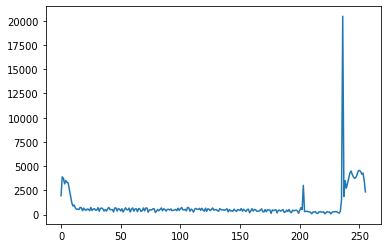

In [125]:
plt.plot(cv2.calcHist([show_rainbow],[0],mask=None,histSize=[256],ranges=[0,256]))

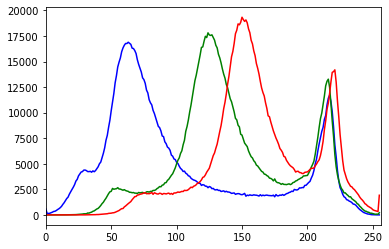

In [124]:
for i,col in enumerate(('b','g','r')):
    histscr=cv2.calcHist([show_bricks],[i],None,[256],[0,256])
    plt.plot(histscr,color=col)
    plt.xlim([0,256])

In [126]:
## hist calculation using masking

In [127]:
rainbow.shape

(550, 413, 3)

In [162]:
mask=np.zeros(rainbow.shape[:2],dtype=np.uint8)##datatype matters

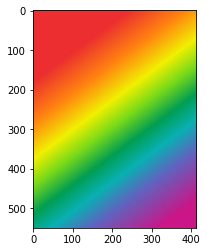

In [163]:
plt.imshow(show_rainbow)

In [164]:
mask[300:400,100:400]=255

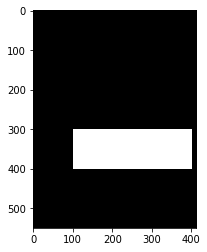

In [165]:
plt.imshow(mask,cmap='gray')

In [166]:
mask.shape

(550, 413)

In [168]:
#cv2.bitwise_and(rainbow,rainbow,mask=mask)

In [169]:
show_rainbow.shape

(550, 413, 3)

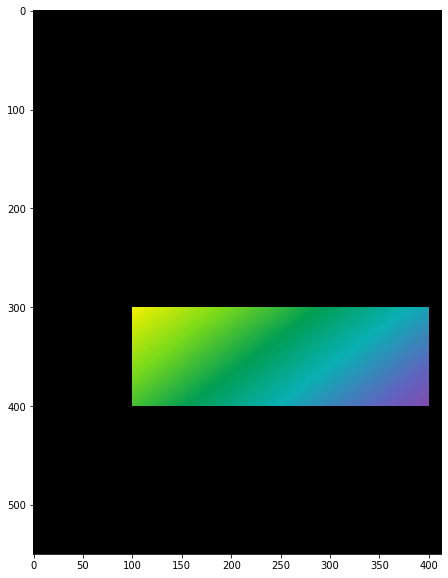

In [171]:
display(cv2.bitwise_and(show_rainbow,show_rainbow,mask=mask))

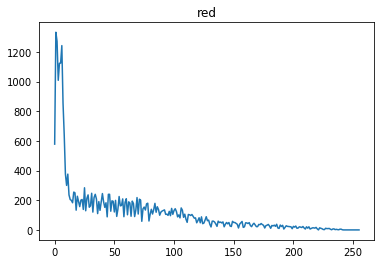

In [185]:
plt.title("red")
plt.plot(cv2.calcHist([rainbow],[2],mask=mask,histSize=[256],ranges=[0,256])) ##B G R
plt.show()

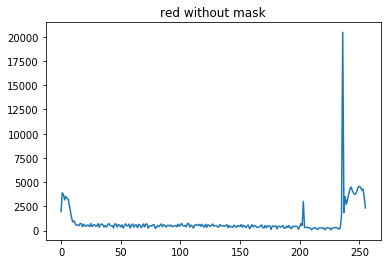

In [186]:
plt.title("red without mask")
plt.plot(cv2.calcHist([rainbow],[2],mask=None,histSize=[256],ranges=[0,256])) ##B G R
plt.show()

In [196]:
#Histogram Equalization

In [187]:
gorila=cv2.imread('DATA/gorilla.jpg',0)

In [191]:
gorila.shape

(1295, 1955)

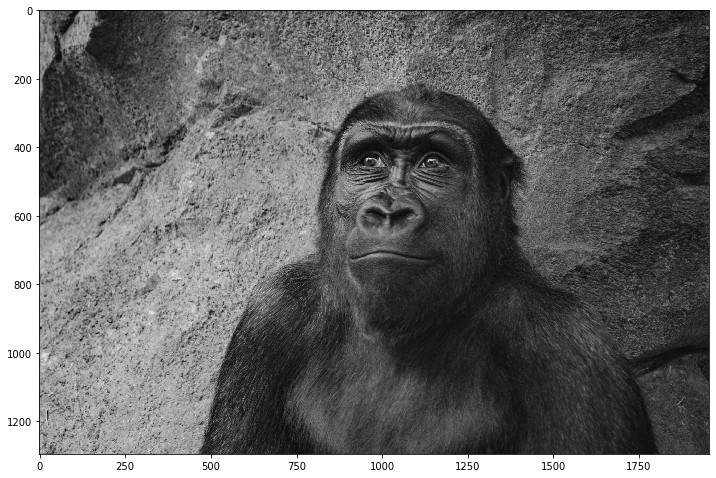

In [188]:
display(gorila)

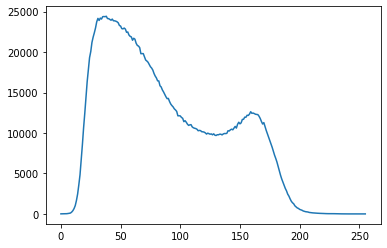

In [190]:
plt.plot(cv2.calcHist([gorila],[0],mask=None,histSize=[256],ranges=[0,256]))

In [198]:
eq_gorila=cv2.equalizeHist(gorila)

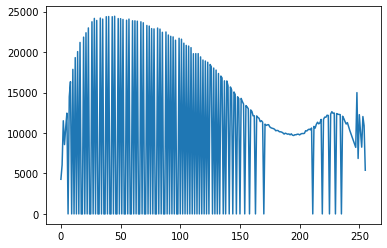

In [200]:
plt.plot(cv2.calcHist([eq_gorila],[0],mask=None,histSize=[256],ranges=[0,256]))
plt.show()

In [201]:
gorila_col=cv2.imread('DATA/gorilla.jpg')
gorila_col=cv2.cvtColor(gorila_col,cv2.COLOR_BGR2RGB)

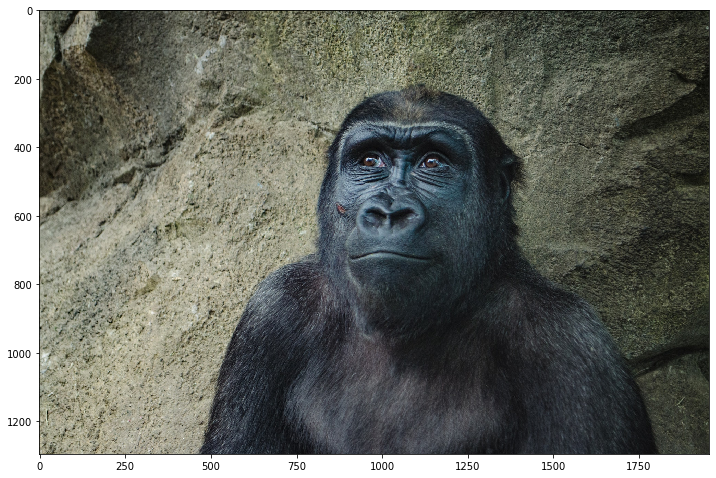

In [202]:
display(gorila_col,cmap=None)

In [216]:
hsv=cv2.cvtColor(gorila_col,cv2.COLOR_RGB2HSV)

In [217]:
hsv[:,:,2]  # hue(0) saturation(1) value(2)

array([[127, 121, 115, ...,  43,  42,  42],
       [121, 124, 123, ...,  47,  49,  51],
       [118, 129, 131, ...,  47,  50,  53],
       ...,
       [196, 198, 185, ...,  55,  55,  55],
       [184, 185, 182, ...,  51,  52,  53],
       [174, 170, 173, ...,  49,  50,  50]], dtype=uint8)

In [218]:
hsv[:,:,2]=cv2.equalizeHist(hsv[:,:,2])

In [219]:
gor_col=cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)

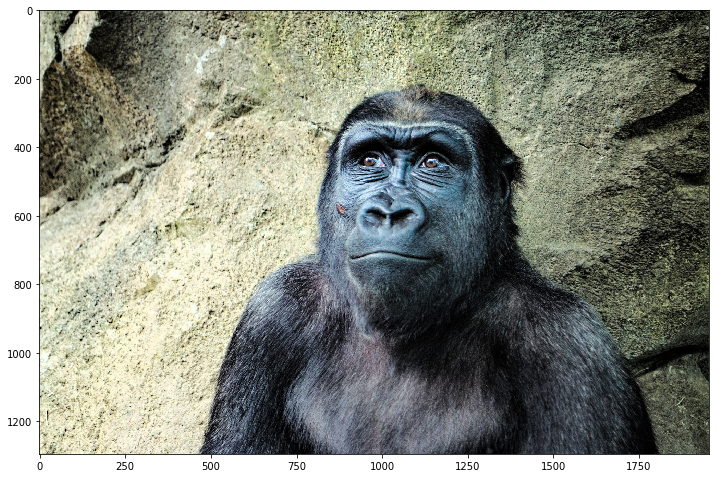

In [220]:
display(gor_col,cmap=None)